# Clustering

Cristobal Donoso Oliva<br>
Universidad de Concepcion, Chile<br>
cridonoso@inf.udec.cl<br>


_Viernes 13 de Noviembre del 2020_

<img src="./img/summaryClustering.png" height="742" width="742">

## K-means

![https://mubaris.com/posts/kmeans-clustering/](./img/k4XcapI.gif)

En el algoritmo K-means se asume que **cada cluster** posee una matriz de **covarianza esferica** (isotropica). 
<br>
Entonces **el cluster** mas probable para cada muestra $x_i \in X$ puede ser obtenido encontrando el prototipo mas cercano:
<br><br>
<center>$
z^*_i = argmin_k ||x_i - \mu_k||^2_2
$</center>
<br>
donde $z_i^*$ es el cluster optimo para la muestra $x_i$, el cual minimiza la distancia euclidiana entre $N$ puntos y $K$ centroides.<br><br>

Se han propuesto tecnicas para acelerar la ejecucion del algoritmo, el cual tiene una complejidad temporal de $\mathcal{O}(NKD)$ en bruto *(Triangle inequality, Elkan 2003)*. <br>
<br><br>
El problema de optimizacion puede ser abordado coo un Problema de Maximizacion de la Esperanza. Consta de dos pasos principales:

- Actualizar los centroides de cada cluster (E): $\ \mu_k = \frac{1}{N_k}\sum_{i:z_i=k}x_i$
- Actualizar las asignaciones (M): $\ z^*_i = argmin_k ||x_i - \mu_k||^2_2$

## Generacion de Datos Sinteticos

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_blobs

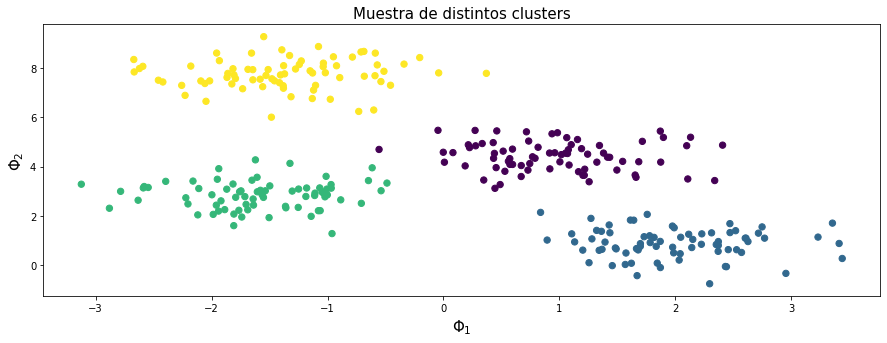

In [2]:
X, y_true = make_blobs(n_samples=300, centers=4,
                       cluster_std=0.60, random_state=0)

plt.figure(figsize=(15,5))
plt.scatter(X[:, 0], X[:, 1], s=40,c=y_true, cmap='viridis')
plt.title('Muestra de distintos clusters', fontsize=15)
plt.xlabel(r'$\Phi_1$', fontsize=15)
plt.ylabel(r'$\Phi_2$', fontsize=15)
plt.show()

## K-means en Scikit-Learn

In [3]:
from sklearn.cluster import KMeans

In [4]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

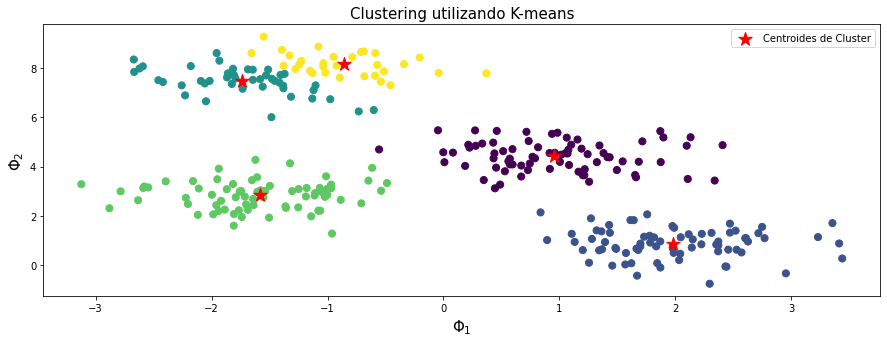

In [5]:
plt.figure(figsize=(15,5)) # Creamos una figura

plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')
centers = kmeans.cluster_centers_

plt.scatter(centers[:, 0], centers[:, 1], marker='*', c='red', s=200, label='Centroides de Cluster')

plt.title('Clustering utilizando K-means', fontsize=15)
plt.xlabel(r'$\Phi_1$', fontsize=15)
plt.ylabel(r'$\Phi_2$', fontsize=15)
plt.legend()
plt.show()

### Spectral clustering

In [6]:
from sklearn.cluster import SpectralClustering
from sklearn.datasets import make_moons

In [7]:
X, y = make_moons(200, noise=.05, random_state=0)

In [8]:
kmeans = KMeans(2, random_state=0)
labels_kmeans = kmeans.fit_predict(X)

In [9]:
spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans')
labels_spectral = spectral.fit_predict(X)

/home/cridonoso/.conda/envs/tf2/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


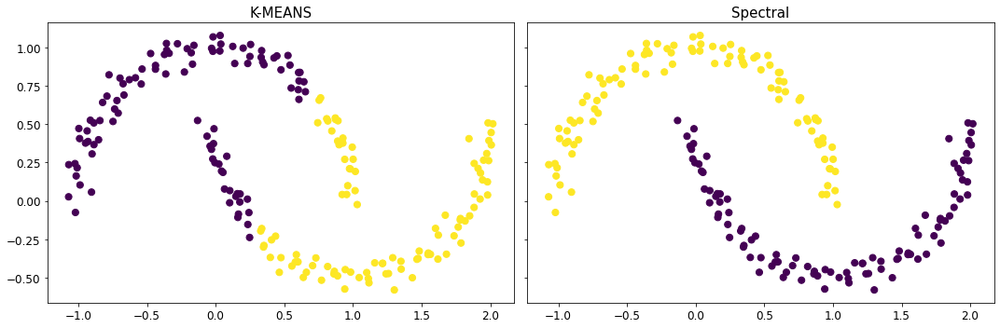

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(15,5), sharey=True)

axes[0].scatter(X[:, 0], X[:, 1], c=labels_kmeans, s=50, cmap='viridis')
axes[0].set_title('K-MEANS', fontsize=15)
axes[0].tick_params(axis='both', labelsize=12)

axes[1].scatter(X[:, 0], X[:, 1], c=labels_spectral, s=50, cmap='viridis')
axes[1].set_title('Spectral', fontsize=15)
axes[1].tick_params(axis='both', labelsize=12)


fig.tight_layout()

plt.show()

## K-means Sobre Imagenes

In [11]:
from sklearn.metrics import pairwise_distances_argmin
from sklearn.utils import shuffle
from PIL import Image
import IPython.display

In [12]:
cantera_img = Image.open('./img/cantera.jpg')

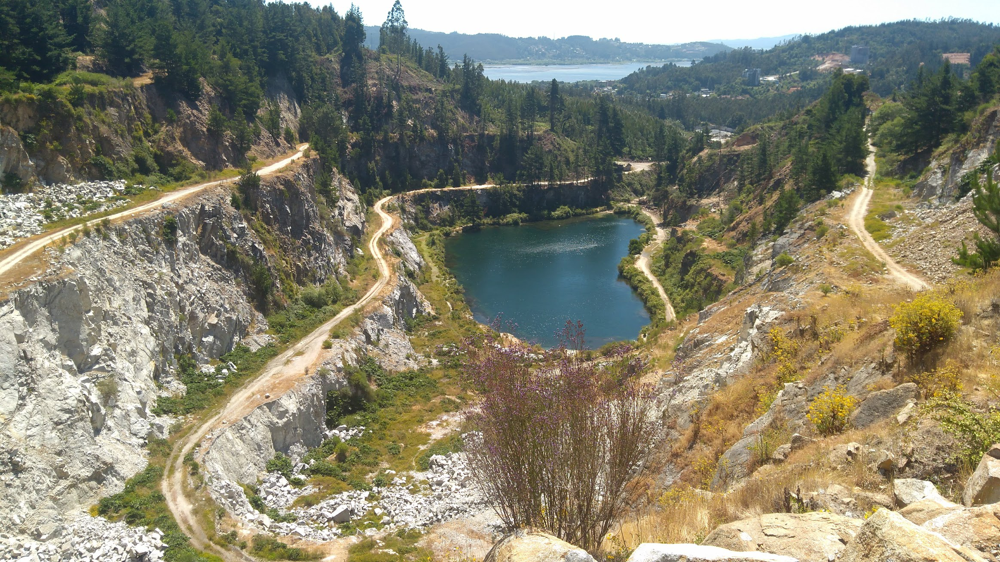

In [13]:
display(cantera_img)

In [14]:
cantera_img = np.array(cantera_img, dtype=np.float64)/255

In [15]:
w,h,d = original_shape = tuple(cantera_img.shape)

In [16]:
image_array = np.reshape(cantera_img, (w * h, d))

In [17]:
image_array_sample = shuffle(image_array, random_state=0)[:1000] # 1000 pixeles aleatorios para entrenar

n_colors = 3
kmeans = KMeans(n_clusters=n_colors, random_state=0)
kmeans = kmeans.fit(image_array_sample)

In [18]:
labels = kmeans.predict(image_array) # Predecimos sobre todo el conjunto de pixeles

In [19]:
codebook_random = shuffle(image_array, random_state=0)[:n_colors] # Definimos centroides aleatorios
# Calculamos la distancia minima entre cada pixel y los centroides
labels_random = pairwise_distances_argmin(codebook_random,
                                          image_array,
                                          axis=0)

In [20]:
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    d = codebook.shape[1]
    image = np.zeros((w, h, d))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    return image

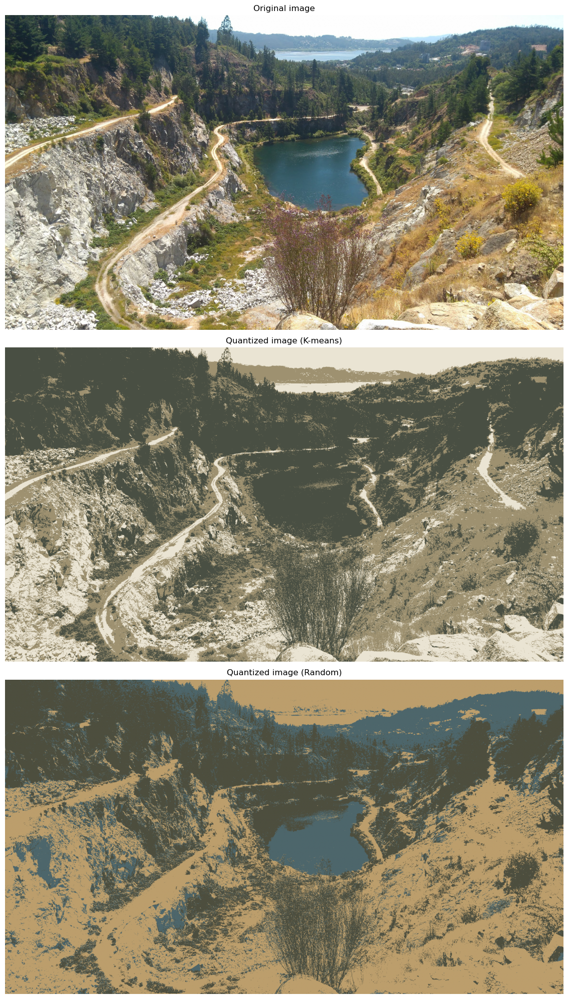

In [21]:
fig, axes = plt.subplots(3, 1, figsize=(20,20), dpi=100)

axes[0].imshow(cantera_img)
axes[0].axis('off')
axes[0].set_title('Original image')

axes[1].imshow(recreate_image(kmeans.cluster_centers_, labels, w, h))
axes[1].axis('off')
axes[1].set_title('Quantized image (K-means)')

axes[2].imshow(recreate_image(codebook_random, labels_random, w, h))
axes[2].axis('off')
axes[2].set_title('Quantized image (Random)')

fig.tight_layout()

## Clustering jerarquico

Como se vio en la primera imagen, existen **dos enfoques** para realizar **clustering**: Particional y Jerarquico.

La principal diferencia de las tecnicas **jerarquicas** con las particionales es que los **cluster jerarquicos estan anidados uno dentro de otro**.

Para **crear los clusters** podemos seguir tecnicas **aglomerativas** (desde abajo hacia arriba) o **divisivas** (de arriba hacia abajo)

- **De abajo hacia arriba** combina los grupos similares
- **De arriba hacia abajo** Divide los grupos por algun criterio de particion

### Agglomerative Clustering

**caso base:** cada muestra es un cluster,

El algoritmo inicia con $N$ grupos, donde $N = \text{Cantidad de datos}$

Por cada paso agrupa los elementos mas parecidos.

- La complejidad del clustering aglomerativo es $O(N^3)$. Si se utiliza una cola de prioridades (priority queue) podemos disminuir la complejidad a $O(N^2logN)$ *(Manning et al. 2008)*.<br><br>
- Para $N$ muy grande, una heuristica comun seria **correr primero K-means** y luego **clustering jerarquico sobre los centroides**.<br>

![aas](./img/hierarch.gif)

[gif source](https://dashee87.github.io/data%20science/general/Clustering-with-Scikit-with-GIFs/)

## Arboles filogenéticos (Phylogenetic Trees)
(Fuente de datos: [data](https://towardsdatascience.com/molecular-phylogenetics-using-bio-phylo-57ce27492ee9))



Los arboles filogeneticos representan **relaciones evolutivas** entre organismos o genes. 

Las **especies o grupos de interes** se encuentran en las terminaciones de **las ramas**. A su vez, cada **punto de rama** puede dividir el conjunto de muestras, generando otras especies.



Consideremos 5 secuencias etiquetadas de ADN

In [22]:
import pandas as pd

In [23]:
df = pd.read_csv('./db/msa.csv')
df.head()

,type,seq
0,Alpha,AACGTGGCCACAT
1,Beta,AAGGTCGCCACAC
2,Gamma,CAGTTCGCCACAA
3,Delta,GAGATTTCCGCCT
4,Epsilon,GAGATCTCCGCCC


In [24]:
matrix = df.values

Primero debemos codificar las bases con enteros

In [25]:
dic = {'A': 0, 'C': 1, 'G':2, 'T':3}

In [26]:
new_inputs = []
for seq in matrix[:, 1]:
    new_seq = []
    for amin in seq:
        new_seq.append(dic[amin])
    new_inputs.append(new_seq)

In [27]:
new_inputs

[[0, 0, 1, 2, 3, 2, 2, 1, 1, 0, 1, 0, 3],
 [0, 0, 2, 2, 3, 1, 2, 1, 1, 0, 1, 0, 1],
 [1, 0, 2, 3, 3, 1, 2, 1, 1, 0, 1, 0, 0],
 [2, 0, 2, 0, 3, 3, 3, 1, 1, 2, 1, 1, 3],
 [2, 0, 2, 0, 3, 1, 3, 1, 1, 2, 1, 1, 1]]

In [28]:
from sklearn.cluster import AgglomerativeClustering

In [29]:
hc = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='average')
clusters = hc.fit_predict(new_inputs)

In [30]:
clusters

array([0, 0, 0, 1, 1])

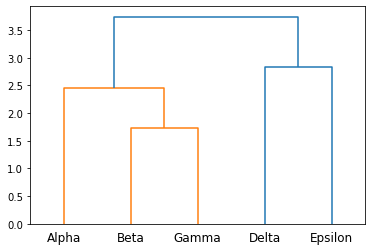

In [31]:
from scipy.cluster.hierarchy import dendrogram, linkage
Z = linkage(new_inputs)
dendrogram(Z, labels=['Alpha', 'Beta', 'Gamma', 'Delta', 'Epsilon']) 
plt.show()

## DB-Scan

Clustering basado en la **densidad espacial**

Este algoritmo posee dos hiperparametros:

- Eps ($\epsilon$): Radio maximo de vecindad 
- Numero minimo de puntos (MinPts): Numero minimo de puntos en la $\epsilon\text{-vecindad}$ de cada punto 
<br><br>

**No se necesita definir el numero de clusters**
![as](./img/DBSCAN_tutorial.gif)
*([Fuente](https://dashee87.github.io/data%20science/general/Clustering-with-Scikit-with-GIFs/) de la imagen)*

In [32]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

In [33]:
# #############################################################################
# Generate sample data
centers = [[1, 1], [-1, -1], [1, -1]]
X, labels_true = make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
                            random_state=0)

In [34]:
X_scaled = StandardScaler().fit_transform(X)

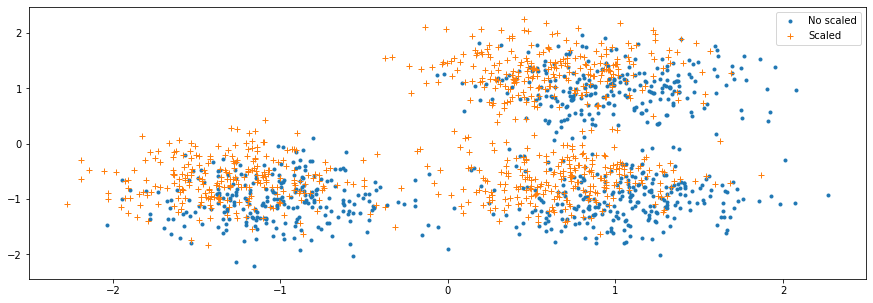

In [35]:
plt.figure(figsize=(15,5))
#plt.subplot(121)
plt.plot(X[:,0], X[:,1], '.', label='No scaled')
plt.plot(X_scaled[:,0], X_scaled[:,1], '+', label='Scaled')
plt.legend()
plt.show()


In [36]:
db = DBSCAN(eps=0.3, min_samples=10)
db = db.fit(X)

In [37]:
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

In [38]:
unique_labels = np.unique(labels)

In [39]:
n_clusters_ = len(unique_labels) - (1 if -1 in labels else 0)
n_clusters_

3

#### Metricas de desempeno

- Un cluster satisface **homogeneidad** si todos sus clusters contienen puntos que pertenecen a solo una clase
- Un cluster satisface **completitud** si todos los puntos que son parte de una clase son elementos de la misma clase
- **V-measure** (medida-V): $v = 2*\left(\frac{\text{homogeneity}\ *\ \text{completeness} }{\text{homogeneity}\ +\  \text{completeness}}\right) $
- **Coeficiente de Silhouette** es calculado utilizando distancia media entre muestras del cluster (a) y entre clusters (b): $\frac{b - a}{\max(a, b)}$

In [40]:
print('Estimated number of clusters: %d' % n_clusters_) 
print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels))

Estimated number of clusters: 3
Homogeneity: 0.947
Completeness: 0.868
V-measure: 0.906
Silhouette Coefficient: 0.621


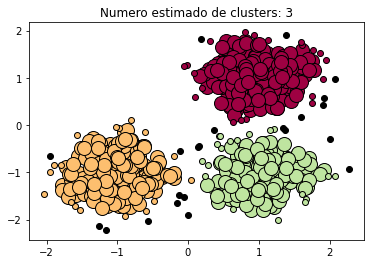

In [41]:
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Numero estimado de clusters: %d' % n_clusters_)
plt.show()

# Desafio MNIST

MNIST es un conjunto de datos publico, el cual contiene **imagenes de digitos** escritos a mano.

In [42]:
from sklearn.datasets import load_digits
digits = load_digits()
inp_size = digits.data.shape
inp_size

(1797, 64)

In [43]:
img_size = int(np.sqrt(inp_size[1]))

In [44]:
labels = digits['target']
images = np.reshape(digits['data'], [inp_size[0],img_size,img_size])
images.shape

(1797, 8, 8)

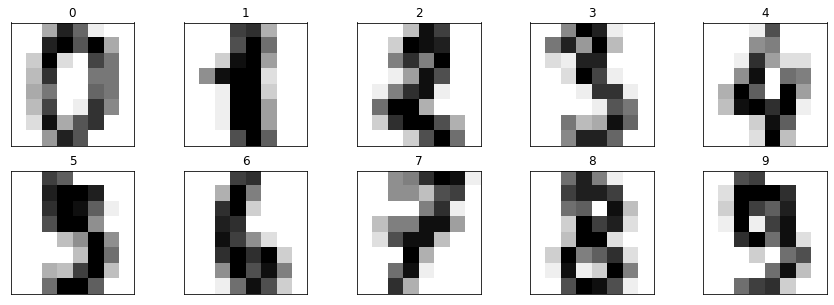

In [45]:
fig, axes = plt.subplots(2, 5, figsize=(15, 5))

for i, img in enumerate(images[:10]):
    col = i//5
    row = i%5
    axes[col][row].imshow(img, interpolation='nearest', cmap=plt.cm.binary)
    axes[col][row].set_title(labels[i])
    axes[col][row].set_xticks([])
    axes[col][row].set_yticks([])

El desafio es crear un clasificador **No supervisado** de digitos
###### Considerese
- Encontrar hiperparametros optimos basandose en silhouette
- No es necesario dividir el conjunto de datos (entrenamiento y test)

In [46]:
from scipy import stats
def nonsupervised_acc(clusters, y_true):
    '''Convierte los clusters en etiquetas utilizando 
       la moda sobre las etiquetas reales'''
    map_code = dict()
    for lab in np.unique(clusters):
        group = clusters[clusters == lab]
        true = digits.target[clusters == lab]
        mode = stats.mode(true).mode[0]
        map_code[lab] = mode 
   
    y_pred = np.array([map_code[l] for l in clusters])
    accs = metrics.accuracy_score(y_true, y_pred)
    return accs

In [48]:
## Tu codigo
image_array_sample = digits.data